In [1]:
import os
import random
import shutil
import torch
import cv2
import pytesseract
from PIL import Image
import re

In [ ]:
def split_dataset(data_dir, output_dir, split_ratio=0.8):
    """
    Splits the dataset into training and validation sets.
    
    Args:
        data_dir (str): Path to your data folder (e.g., 'data-yolo').
        output_dir (str): Path where the split data will be stored (e.g., 'data-yolo-split').
        split_ratio (float): Proportion of data to assign to the training set.
    """
    images_dir = os.path.join(data_dir, "images")
    labels_dir = os.path.join(data_dir, "labels")

    # Create the output directories for train and val images and labels
    train_images_dir = os.path.join(output_dir, "train", "images")
    val_images_dir = os.path.join(output_dir, "val", "images")
    train_labels_dir = os.path.join(output_dir, "train", "labels")
    val_labels_dir = os.path.join(output_dir, "val", "labels")
    
    os.makedirs(train_images_dir, exist_ok=True)
    os.makedirs(val_images_dir, exist_ok=True)
    os.makedirs(train_labels_dir, exist_ok=True)
    os.makedirs(val_labels_dir, exist_ok=True)

    # List all image files (modify the extensions as needed)
    images = [f for f in os.listdir(images_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    random.shuffle(images)
    
    split_idx = int(len(images) * split_ratio)
    train_images = images[:split_idx]
    val_images = images[split_idx:]

    # Copy training files
    for image in train_images:
        shutil.copy(os.path.join(images_dir, image), os.path.join(train_images_dir, image))
        # Matching label file based on image name (assuming .txt labels)
        label_file = os.path.splitext(image)[0] + ".txt"
        src_label = os.path.join(labels_dir, label_file)
        if os.path.exists(src_label):
            shutil.copy(src_label, os.path.join(train_labels_dir, label_file))

    # Copy validation files
    for image in val_images:
        shutil.copy(os.path.join(images_dir, image), os.path.join(val_images_dir, image))
        label_file = os.path.splitext(image)[0] + ".txt"
        src_label = os.path.join(labels_dir, label_file)
        if os.path.exists(src_label):
            shutil.copy(src_label, os.path.join(val_labels_dir, label_file))

if __name__ == "__main__":
    data_dir = "data-yolo"          # Your original data folder
    output_dir = "data-yolo-split"    # Output folder for the split data
    split_dataset(data_dir, output_dir, split_ratio=0.8)
    print("Dataset split complete!")

Dataset split complete!


50 epochs completed in 0.389 hours.
Optimizer stripped from yolov5\runs\train\exp4\weights\last.pt, 14.4MB
Optimizer stripped from yolov5\runs\train\exp4\weights\best.pt, 14.4MB

Validating yolov5\runs\train\exp4\weights\best.pt...
Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100%|██████████| 1/1 [00:01<00:0
                   all         14         23      0.787      0.696      0.807      0.333
                 Plate         14         23      0.787      0.696      0.807      0.333
Results saved to yolov5\runs\train\exp4


In [2]:
# YOLOV5 downloaded and fine-tuned model (ensure 'source' is set to 'local' so that it looks in your local repo)
model = torch.hub.load('yolov5', 'custom', path='yolov5/runs/train/exp4/weights/best.pt', source='local')

# Test on a single image:
img_path = r'data\Brazil\image\3069000.jpg'

YOLOv5  v7.0-398-g5cdad892 Python-3.13.2 torch-2.6.0+cpu CPU

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


YOLOv5  v7.0-398-g5cdad892 Python-3.13.2 torch-2.6.0+cpu CPU

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
c:\Users\merti\Documents\GitHub\challanges-app\yolov5\models\common.py:894: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
image 1/1: 2160x3840 1 Plate
Speed: 79.9ms pre-process, 57.7ms inference, 5.7ms NMS per image at shape (1, 3, 384, 640)


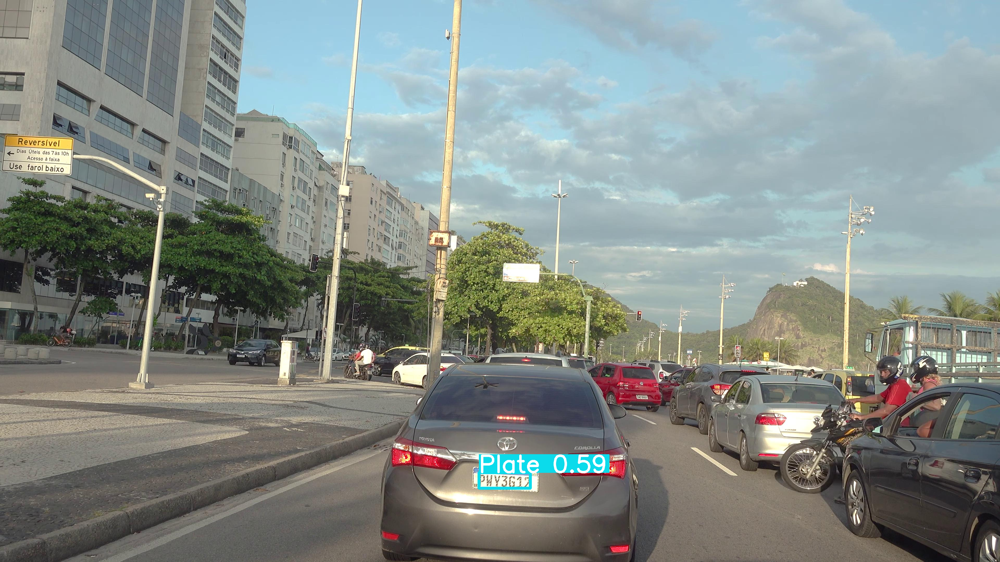

Saved 1 image to runs\detect\custom_test4


In [ ]:
results = model(img_path)

# Print the detection results (bounding boxes, confidences, class names, etc.)
results.print()

# Show the image with detections (this will open a window; press any key to close)
results.show()

# Alternatively, you can save the annotated image to a directory:
results.save(save_dir='runs/detect/custom_test')


In [ ]:

def detect_license_plates(image_path, model):
    """Detects license plate regions using YOLOv5.
        
    Returns an array of detections [xmin, ymin, xmax, ymax, confidence, class].
    """
    results = model(image_path)
    return results.xyxy[0].numpy()  # Returns detection results

def preprocess_plate(cropped_img):
    """Preprocesses a cropped license plate image for OCR.
    
    Steps include converting to grayscale, resizing, thresholding,
    and noise reduction.
    """
    # Convert image to grayscale.
    gray = cv2.cvtColor(cropped_img, cv2.COLOR_BGR2GRAY)
    # Optionally, resize to a fixed height for consistency (e.g., height = 200 pixels)
    height = 200
    ratio = height / gray.shape[0]
    new_width = int(gray.shape[1] * ratio)
    resized = cv2.resize(gray, (new_width, height))
    # Apply Otsu's thresholding to binarize the image.
    thresh = cv2.threshold(resized, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
    # Reduce noise with a median blur.
    denoised = cv2.medianBlur(thresh, 3)
    return denoised

def extract_plate_text(image):
    """Extracts text from the preprocessed image using Tesseract OCR.
    
    Uses Page Segmentation Mode 7 which treats the image as a single line of text.
    """
    text = pytesseract.image_to_string(image, config='--psm 7')
    return text.strip()

# Country Regex Patterns (as provided)
country_patterns = {
    'Brazil': r'^[A-Z]{3}[0-9][0-9A-Z][0-9]{2}$',
    'Estonia': r'^[0-9]{3}[A-Z]{3}$',
    'Finland': r'^[A-ZÅÄÖ]{2,3}-?\d{1,3}$',
    'Kazakhstan': r'^\d{3} [A-Z]{2} \d{2}$',
    'Lithuania': r'^[A-Z]{3} \d{3}$',
    'Serbia': r'^(BG|NS|NI|KG|SU|VR|VA|PA|SA|ZO|JA|SD|SC|LE|KO|RU|PV|UE|ČA|ZA|SO|KŠ|PE|PK|TO|BO|BĆ|PŽ|ŠA|PČ|PI|KL|VO|VS|KR|AR|BA|BP|BE|BL|BOR|ZLA|JAG|PRI|KAN|KVA|KRA|MAČ|POD|RAS|RAŠ|SRE|TOP|ŠUM|BRU|VAL|VRN|ZAJ|ZEM)[A-Z0-9]{4,5}$',
    'UAE': r'^[A-Z]{1,3} \d{1,4}$'
}

def identify_country(text):
    """Identifies the license plate country by matching the OCR text against regex patterns."""
    # Remove any non-alphanumeric characters and convert to uppercase.
    clean_text = re.sub(r'[\W_]', '', text.upper())
    for country, pattern in country_patterns.items():
        if re.fullmatch(pattern, clean_text):
            return country
    return "Unknown"

def process_image(image_path):
    """Full pipeline for a given image:
       - Detect license plates using YOLOv5.
       - Crop and preprocess the plate region.
       - Extract text with Tesseract OCR.
       - Identify the country based on regex matching.
    """
    detections = detect_license_plates(image_path, model)
    img = cv2.imread(image_path)
    plate_texts = []
    plate_countries = []
    
    for det in detections:
        # Unpack detection coordinates (optionally, you can use float values)
        xmin, ymin, xmax, ymax, conf, cls = det
        xmin, ymin, xmax, ymax = map(int, [xmin, ymin, xmax, ymax])
        
        # Crop the detected license plate region.
        cropped_plate = img[ymin:ymax, xmin:xmax]
        if cropped_plate.size == 0:
            continue
        
        # Preprocess the cropped image to improve OCR accuracy.
        preprocessed = preprocess_plate(cropped_plate)
        # Extract text from the preprocessed image.
        text = extract_plate_text(preprocessed)
        plate_texts.append(text)
        # Identify the country based on the extracted text.
        country = identify_country(text)
        plate_countries.append(country)
        
        # --- Updated visualization settings ---
        line_thickness = 5    # for a thicker rectangle
        font_scale = 4      # for larger text
        font_thickness = 5    # text thickness for better readability
        font_box_color = (0, 0, 255)  # Red in BGR
        # -------------------------------------

        # For visualization: draw bounding box and display extracted text with country.
        cv2.rectangle(img, (xmin, ymin), (xmax, ymax), font_box_color, line_thickness)
        cv2.putText(img, f"{text} ({country})", (xmin, max(ymin-10, 0)), 
                    cv2.FONT_HERSHEY_SIMPLEX, font_scale, font_box_color, font_thickness)
    # ----- Added resize for display -----
    max_display_width = 800
    max_display_height = 600
    h, w = img.shape[:2]
    scale_factor = min(max_display_width / w, max_display_height / h, 1.0)  # never upscale
    if scale_factor < 1.0:
        display_img = cv2.resize(img, (int(w * scale_factor), int(h * scale_factor)))
    else:
        display_img = img
    # --------------------------------------
    
    # Display the annotated image.
    cv2.imshow("Detected License Plates", display_img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
    
    return plate_texts, plate_countries
    


In [4]:
# Test the above plate reading functions here
plate_texts, plate_countries = process_image(img_path) # Use the same image path as before
print("Extracted Plate Texts:", plate_texts)
print("Identified Countries:", plate_countries)

c:\Users\merti\Documents\GitHub\challanges-app\yolov5\models\common.py:894: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


Extracted Plate Texts: ['PUY 3677']
Identified Countries: ['Brazil']
